In [1]:
# Module Importations
import matplotlib.pylab as plt
import numpy as np
import os.path
import pandas as pd
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split

In [2]:
# Project Module Importations
from src.data import load_data
from src.data import split_data
from src.visualisation import save_figs

# Switches saving figures on/off
SAVE_FIGURES = False

In [3]:
# Load dataset.
original_dataset = load_data.load_motor_data()

In [4]:
# View motor dataset macro data
print(original_dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
ambient           998070 non-null float64
coolant           998070 non-null float64
u_d               998070 non-null float64
u_q               998070 non-null float64
motor_speed       998070 non-null float64
torque            998070 non-null float64
i_d               998070 non-null float64
i_q               998070 non-null float64
pm                998070 non-null float64
stator_yoke       998070 non-null float64
stator_tooth      998070 non-null float64
stator_winding    998070 non-null float64
profile_id        998070 non-null int64
dtypes: float64(12), int64(1)
memory usage: 99.0 MB
None


In [5]:
# View motor dataset statistics
print(original_dataset.describe())

ambient        coolant            u_d            u_q  \
count  998070.000000  998070.000000  998070.000000  998070.000000   
mean       -0.003905       0.004723       0.004780      -0.005690   
std         0.993127       1.002423       0.997878       1.002330   
min        -8.573954      -1.429349      -1.655373      -1.861463   
25%        -0.599385      -1.037925      -0.826359      -0.927390   
50%         0.266157      -0.177187       0.267542      -0.099818   
75%         0.686675       0.650709       0.358491       0.852625   
max         2.967117       2.649032       2.274734       1.793498   

         motor_speed         torque            i_d            i_q  \
count  998070.000000  998070.000000  998070.000000  998070.000000   
mean       -0.006336      -0.003333       0.006043      -0.003194   
std         1.001229       0.997907       0.998994       0.997912   
min        -1.371529      -3.345953      -3.245874      -3.341639   
25%        -0.951892      -0.266917      -0.75

In [6]:
# Peek at motor dataset
print(original_dataset.head(5))

ambient   coolant       u_d       u_q  motor_speed    torque       i_d  \
0 -0.752143 -1.118446  0.327935 -1.297858    -1.222428 -0.250182  1.029572   
1 -0.771263 -1.117021  0.329665 -1.297686    -1.222429 -0.249133  1.029509   
2 -0.782892 -1.116681  0.332771 -1.301822    -1.222428 -0.249431  1.029448   
3 -0.780935 -1.116764  0.333700 -1.301852    -1.222430 -0.248636  1.032845   
4 -0.774043 -1.116775  0.335206 -1.303118    -1.222429 -0.248701  1.031807   

        i_q        pm  stator_yoke  stator_tooth  stator_winding  profile_id  
0 -0.245860 -2.522071    -1.831422     -2.066143       -2.018033           4  
1 -0.245832 -2.522418    -1.830969     -2.064859       -2.017631           4  
2 -0.245818 -2.522673    -1.830400     -2.064073       -2.017343           4  
3 -0.246955 -2.521639    -1.830333     -2.063137       -2.017632           4  
4 -0.246610 -2.521900    -1.830498     -2.062795       -2.018145           4  


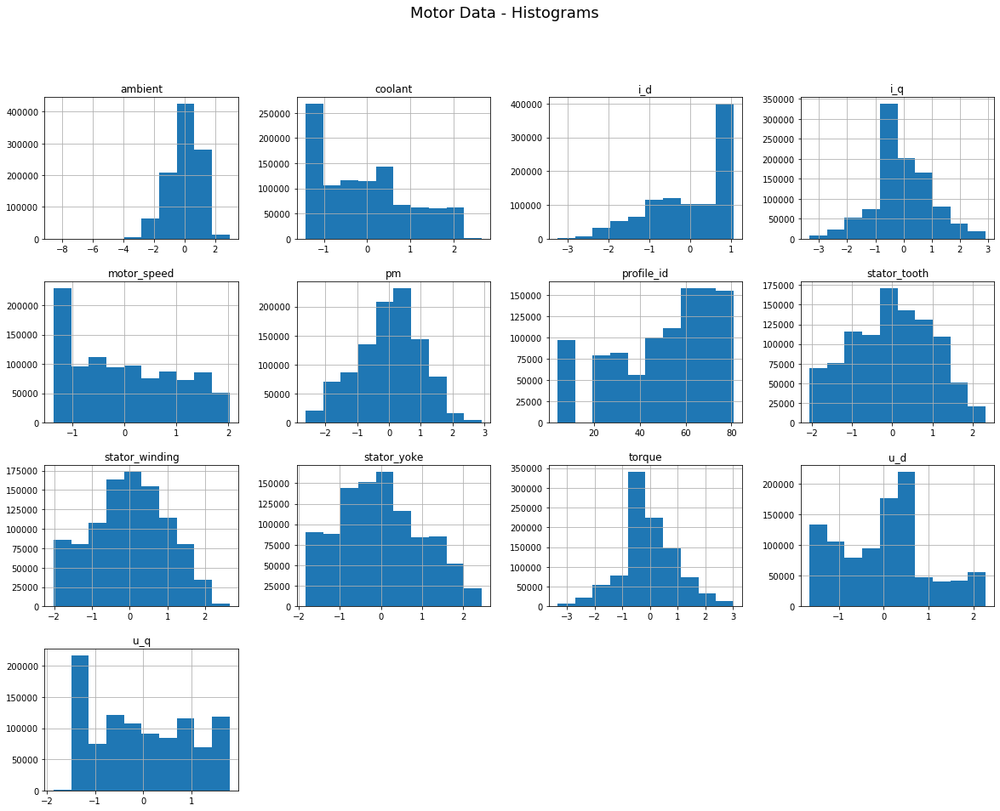

In [7]:
# Visualise motor data.
original_dataset.hist(figsize = (20,15))

# Set title, other parameters
plt.suptitle("Motor Data - Histograms", fontsize = save_figs.TITLE_FONTSIZE)

# Drop profile ID

# Save fig
if SAVE_FIGURES == True: 
    name = 'Motor_Data_Histogram'
    save_string = save_figs.generate_fig_save_string(name)
    plt.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [8]:
# Split data into training and test sets
training_set, test_set = split_data.split_train_test(original_dataset, 0.8)

In [9]:
# Evaluate linear correlations
correlation_set = training_set

corr_matrix = correlation_set.corr()

print(corr_matrix)

ambient   coolant       u_d       u_q  motor_speed    torque  \
ambient         1.000000  0.437470  0.195340  0.090133     0.080537 -0.263367   
coolant         0.437470  1.000000  0.178905  0.033112    -0.029486 -0.190596   
u_d             0.195340  0.178905  1.000000 -0.028934    -0.233776 -0.820658   
u_q             0.090133  0.033112 -0.028934  1.000000     0.717530 -0.037685   
motor_speed     0.080537 -0.029486 -0.233776  0.717530     1.000000  0.023205   
torque         -0.263367 -0.190596 -0.820658 -0.037685     0.023205  1.000000   
i_d             0.006019  0.107323  0.357663 -0.183283    -0.722841 -0.239351   
i_q            -0.261584 -0.186963 -0.795990 -0.026711     0.005058  0.996585   
pm              0.506029  0.433865 -0.080197  0.107678     0.336315 -0.075601   
stator_yoke     0.454913  0.874691  0.043030  0.111916     0.185693 -0.093738   
stator_tooth    0.399817  0.690937 -0.063901  0.154450     0.336184 -0.012648   
stator_winding  0.304001  0.511846 -0.148205 

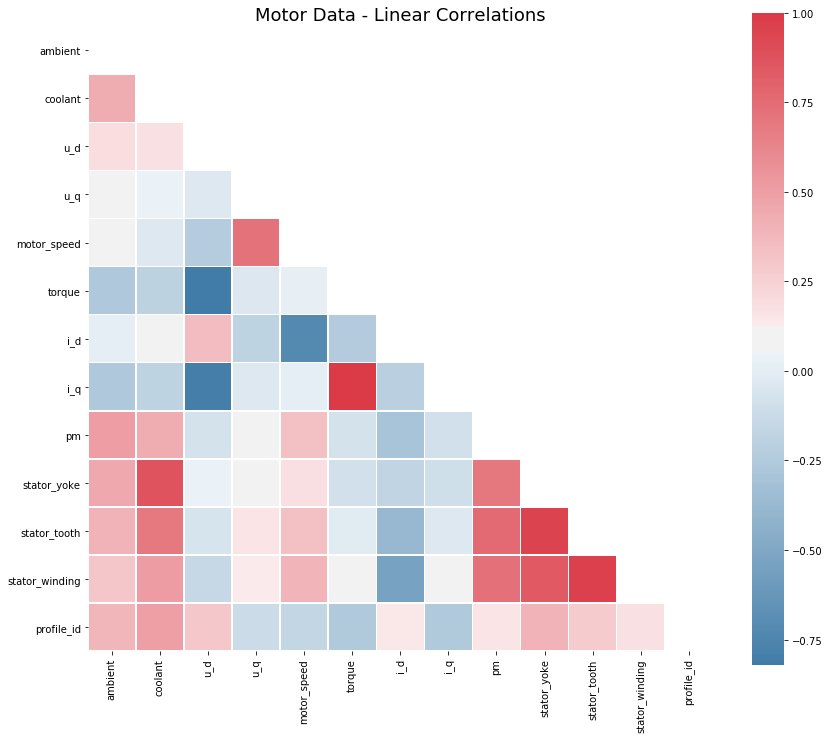

In [10]:
# Visualise linear correlations

plt.figure(figsize = (14, 12))

# Create symmetry mask
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

# Create diverging colour map
cmap = sns.diverging_palette(240, 10, n = 8, as_cmap = True)

# Create heatmap figure 
lin_corr_fig = sns.heatmap(corr_matrix, mask = mask, cmap = cmap, square = True, linewidths = 0.5)

# Set title, other parameters
plt.title("Motor Data - Linear Correlations", fontsize = save_figs.TITLE_FONTSIZE)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Motor_Data_Correlations'
    save_string = save_figs.generate_fig_save_string(name)
    plt.savefig(save_string, format = 'png', dpi = 600)

plt.show()

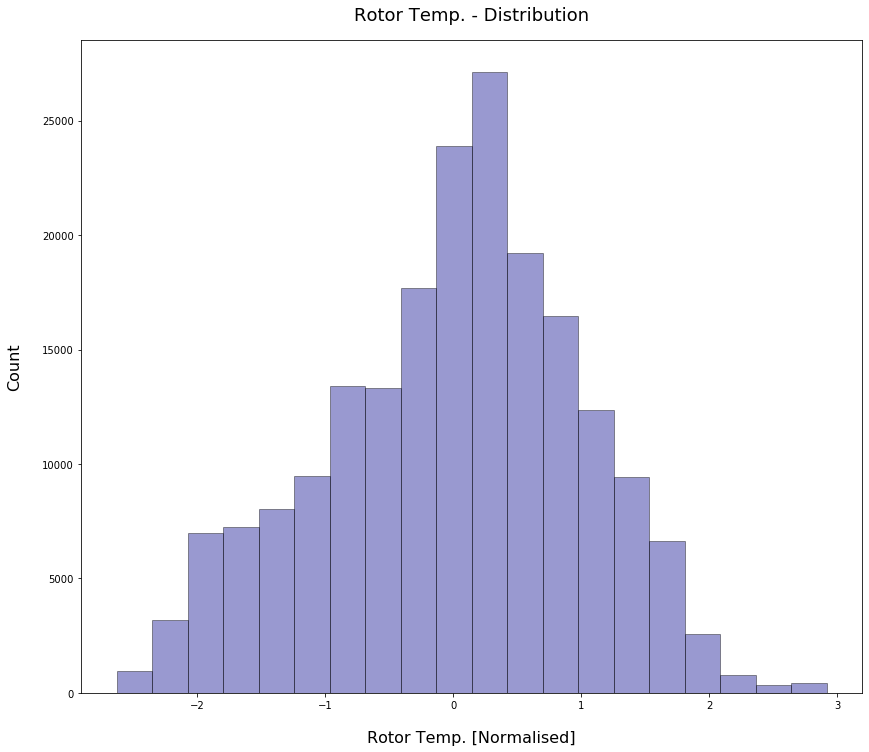

In [11]:
# Rotor temp histogram

plt.figure(figsize = (14, 12))

# Create histogram
y_data = training_set["pm"]
lin_corr_fig = sns.distplot(y_data, bins = 20, hist = True, kde = False, color = "darkblue", hist_kws = {'edgecolor':'black'})

# Set title, axes
plt.title("Rotor Temp. - Distribution", fontsize = save_figs.TITLE_FONTSIZE, pad = 20)
plt.xlabel("Rotor Temp. [Normalised]", fontsize = 16, labelpad = 20)
plt.ylabel("Count", fontsize = 16, labelpad = 20)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Rotor_Temp_Distribution'
    save_string = save_figs.generate_fig_save_string(name)
    plt.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [12]:
# Create sample subset of training set (training set is large).
eda_subset, eda_discard = train_test_split(training_set, test_size = 0.99, random_state = 42) 

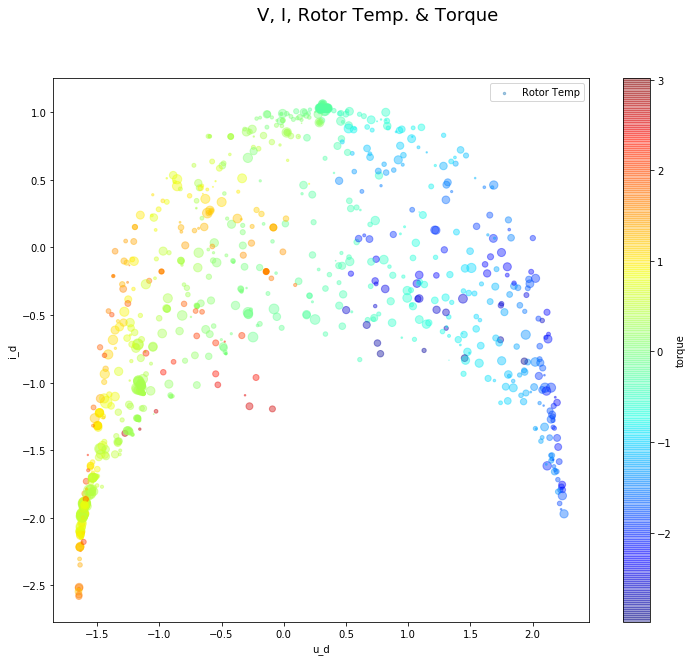

In [13]:
# Visualise relationship between current, voltage, rotor temperature and torque
fig, ax = plt.subplots(figsize = (12, 10))

eda_subset.plot(kind = "scatter", x = "u_d", y = "i_d", alpha = 0.4,
    s = eda_subset["pm"] * 50, label = "Rotor Temp",
    c = "torque", cmap = plt.get_cmap("jet"), colorbar = True, ax = ax)

fig.suptitle('V, I, Rotor Temp. & Torque', fontsize = save_figs.TITLE_FONTSIZE)

plt.legend()

# Save fig
if SAVE_FIGURES == True: 
    name = 'Current_Voltage_Torque_Rotor_Temp'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

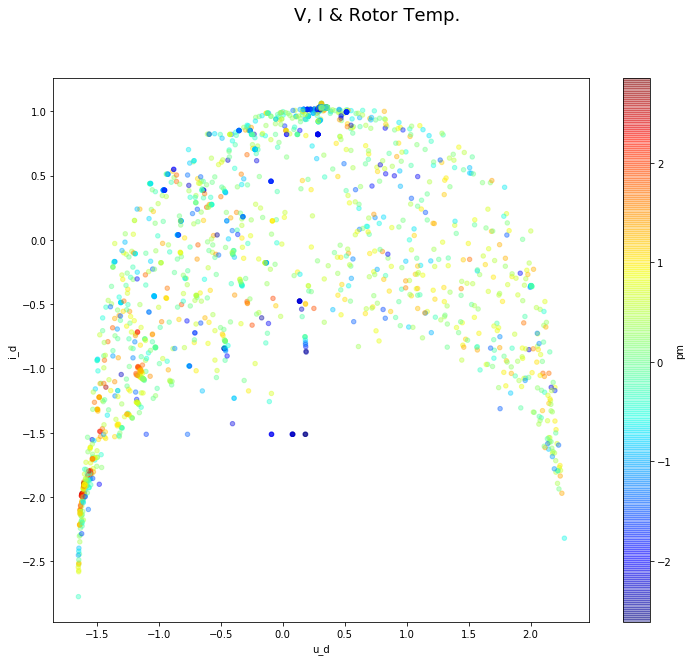

In [14]:
# Visualise relationship between current, voltage and rotor temperature
fig, ax = plt.subplots(figsize = (12, 10))

eda_subset.plot(kind = "scatter", x = "u_d", y = "i_d", alpha = 0.4,
    c = "pm", cmap = plt.get_cmap("jet"), colorbar = True, ax = ax)

fig.suptitle('V, I & Rotor Temp.', fontsize = save_figs.TITLE_FONTSIZE)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Current_Voltage_Rotor_Temp'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [15]:
# Evaluate correlation for pm
corr_matrix["pm"].sort_values(ascending = False)

pm                1.000000
stator_tooth      0.769120
stator_winding    0.729552
stator_yoke       0.696648
ambient           0.506029
coolant           0.433865
motor_speed       0.336315
profile_id        0.157138
u_q               0.107678
torque           -0.075601
u_d              -0.080197
i_q              -0.088930
i_d              -0.297693
Name: pm, dtype: float64

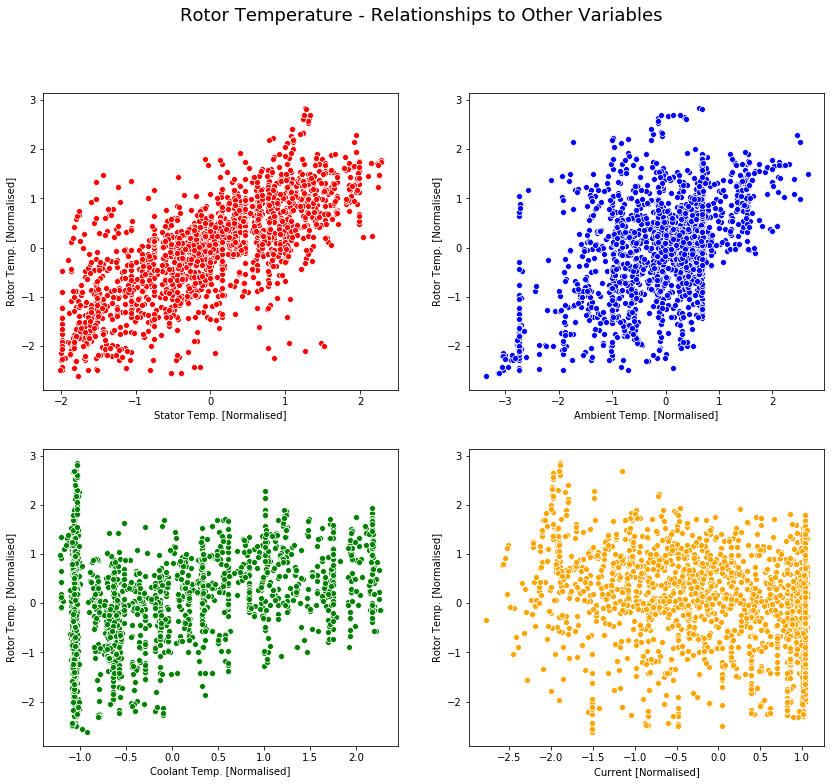

In [16]:
# Visualise rotor temp relationships with other parameters 
# (Stator Tooth, Ambient, Coolant, i_d)

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 12))

data = eda_subset

# Populate each subplot
sns.scatterplot(data = data, x = "stator_tooth", y = "pm", ax = axes[0,0], color = 'red')
sns.scatterplot(data = data, x = "ambient", y = "pm", ax = axes[0,1], color = 'blue')
sns.scatterplot(data = data, x = "coolant", y = "pm", ax = axes[1,0], color = 'green')
sns.scatterplot(data = data, x = "i_d", y = "pm", ax = axes[1,1], color = 'orange')

# Set title, axes
plt.suptitle("Rotor Temperature - Relationships to Other Variables", fontsize = save_figs.TITLE_FONTSIZE)

axes[0,0].set(xlabel = 'Stator Temp. [Normalised]', ylabel = 'Rotor Temp. [Normalised]')
axes[0,1].set(xlabel = 'Ambient Temp. [Normalised]', ylabel = 'Rotor Temp. [Normalised]')
axes[1,0].set(xlabel = 'Coolant Temp. [Normalised]', ylabel = 'Rotor Temp. [Normalised]')
axes[1,1].set(xlabel = 'Current [Normalised]', ylabel = 'Rotor Temp. [Normalised]')

# Save fig
if SAVE_FIGURES == True: 
    name = 'Rotor_Temp_Relationships'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

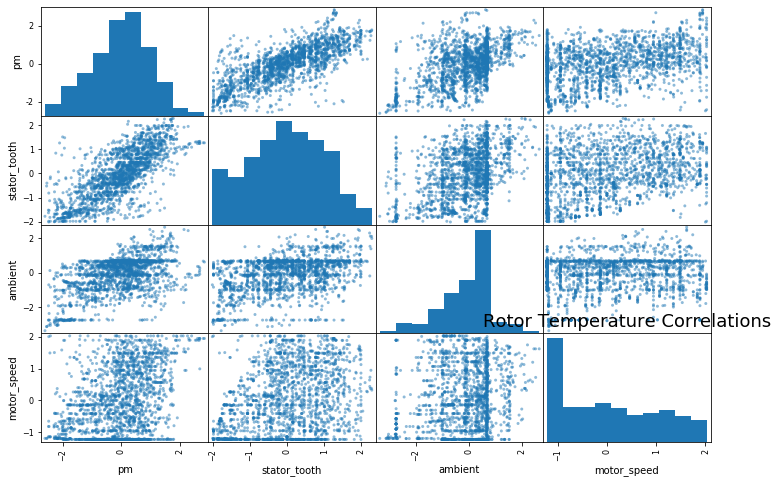

In [17]:
# Create scatter plot for rotor temp and parameters

# Identify attributes of interest
attributes = ["pm", "stator_tooth", "ambient", "motor_speed"]

scatter_matrix(eda_subset[attributes], figsize = (12, 8))

plt.title('Rotor Temperature Correlations', fontsize = save_figs.TITLE_FONTSIZE)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Rotor_Temp_Linear_Corr'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [18]:
# Evaluate correlation for stator temperatures
corr_matrix["stator_yoke"].sort_values(ascending = False)

stator_yoke       1.000000
stator_tooth      0.950264
coolant           0.874691
stator_winding    0.845782
pm                0.696648
ambient           0.454913
profile_id        0.396232
motor_speed       0.185693
u_q               0.111916
u_d               0.043030
torque           -0.093738
i_q              -0.100092
i_d              -0.179041
Name: stator_yoke, dtype: float64

In [19]:
corr_matrix["stator_tooth"].sort_values(ascending = False)

stator_tooth      1.000000
stator_winding    0.965609
stator_yoke       0.950264
pm                0.769120
coolant           0.690937
ambient           0.399817
motor_speed       0.336184
profile_id        0.279388
u_q               0.154450
torque           -0.012648
i_q              -0.026525
u_d              -0.063901
i_d              -0.385875
Name: stator_tooth, dtype: float64

In [20]:
corr_matrix["stator_winding"].sort_values(ascending = False)

stator_winding    1.000000
stator_tooth      0.965609
stator_yoke       0.845782
pm                0.729552
coolant           0.511846
motor_speed       0.394635
ambient           0.304001
profile_id        0.180289
u_q               0.130283
torque            0.080244
i_q               0.060494
u_d              -0.148205
i_d              -0.538025
Name: stator_winding, dtype: float64

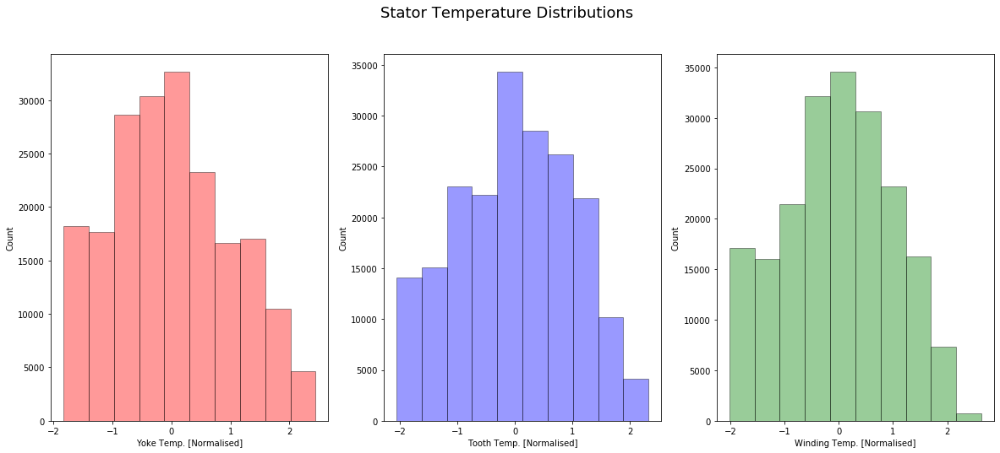

In [21]:
# Stator Temperature Distributions (Histogram)

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (20, 8))

# Create histogram
hist_bins = 10

y_data_yoke = training_set["stator_yoke"]
sns.distplot(y_data_yoke, bins = hist_bins, hist = True, kde = False, ax = axes[0], color = 'red', hist_kws = {'edgecolor':'black'})
y_data_tooth = training_set["stator_tooth"]
sns.distplot(y_data_tooth, bins = hist_bins, hist = True, kde = False, ax = axes[1], color = 'blue', hist_kws = {'edgecolor':'black'})
y_data_winding = training_set["stator_winding"]
sns.distplot(y_data_winding, bins = hist_bins, hist = True, kde = False, ax = axes[2], color = 'green', hist_kws = {'edgecolor':'black'})

# Set title, axes
plt.suptitle("Stator Temperature Distributions", fontsize = save_figs.TITLE_FONTSIZE)

axes[0].set(xlabel = 'Yoke Temp. [Normalised]', ylabel = 'Count')
axes[1].set(xlabel = 'Tooth Temp. [Normalised]', ylabel = 'Count')
axes[2].set(xlabel = 'Winding Temp. [Normalised]', ylabel = 'Count')

# Save fig
if SAVE_FIGURES == True: 
    name = 'Stator_Temp_Distribution'
    save_string = save_figs.generate_fig_save_string(name)
    plt.savefig(save_string, format = 'png', dpi = 600)

plt.show()

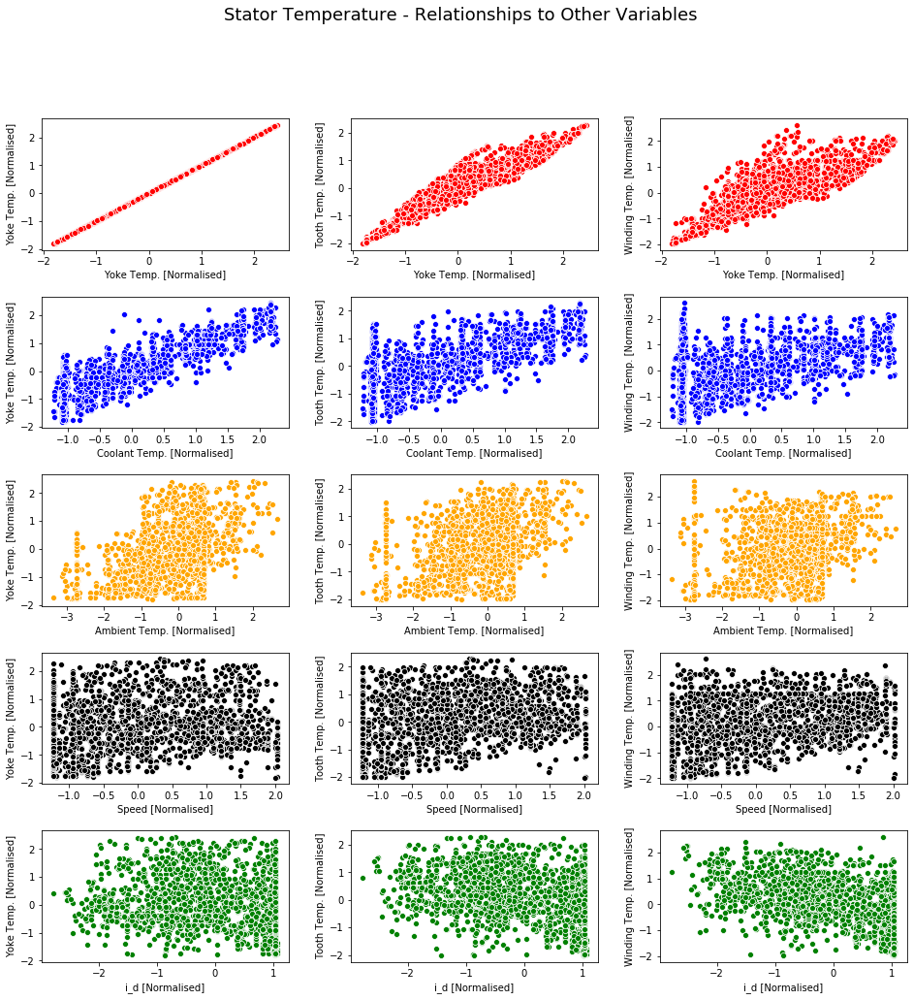

In [22]:
# Stator Temperature Relationships with Other Parameters
# (Stator Yoke, Coolant, Ambient, Motor_Speed, i_d)

fig, axes = plt.subplots(nrows = 5, ncols = 3, figsize = (16, 16))

data = eda_subset

# Populate stator yoke plots
sns.scatterplot(data = data, x = "stator_yoke", y = "stator_yoke", ax = axes[0,0], color = 'red')
sns.scatterplot(data = data, x = "coolant", y = "stator_yoke", ax = axes[1,0], color = 'blue')
sns.scatterplot(data = data, x = "ambient", y = "stator_yoke", ax = axes[2,0], color = 'orange')
sns.scatterplot(data = data, x = "motor_speed", y = "stator_yoke", ax = axes[3,0], color = 'black')
sns.scatterplot(data = data, x = "i_d", y = "stator_yoke", ax = axes[4,0], color = 'green')

# Populate stator tooth plots
sns.scatterplot(data = data, x = "stator_yoke", y = "stator_tooth", ax = axes[0,1], color = 'red')
sns.scatterplot(data = data, x = "coolant", y = "stator_tooth", ax = axes[1,1], color = 'blue')
sns.scatterplot(data = data, x = "ambient", y = "stator_tooth", ax = axes[2,1], color = 'orange')
sns.scatterplot(data = data, x = "motor_speed", y = "stator_tooth", ax = axes[3,1], color = 'black')
sns.scatterplot(data = data, x = "i_d", y = "stator_tooth", ax = axes[4,1], color = 'green')

# Populate stator winding plots
sns.scatterplot(data = data, x = "stator_yoke", y = "stator_winding", ax = axes[0,2], color = 'red')
sns.scatterplot(data = data, x = "coolant", y = "stator_winding", ax = axes[1,2], color = 'blue')
sns.scatterplot(data = data, x = "ambient", y = "stator_winding", ax = axes[2,2], color = 'orange')
sns.scatterplot(data = data, x = "motor_speed", y = "stator_winding", ax = axes[3,2], color = 'black')
sns.scatterplot(data = data, x = "i_d", y = "stator_winding", ax = axes[4,2], color = 'green')

# Set title, axes
plt.suptitle("Stator Temperature - Relationships to Other Variables", fontsize = save_figs.TITLE_FONTSIZE)

axes[0,0].set(xlabel = 'Yoke Temp. [Normalised]', ylabel = 'Yoke Temp. [Normalised]')
axes[1,0].set(xlabel = 'Coolant Temp. [Normalised]', ylabel = 'Yoke Temp. [Normalised]')
axes[2,0].set(xlabel = 'Ambient Temp. [Normalised]', ylabel = 'Yoke Temp. [Normalised]')
axes[3,0].set(xlabel = 'Speed [Normalised]', ylabel = 'Yoke Temp. [Normalised]')
axes[4,0].set(xlabel = 'i_d [Normalised]', ylabel = 'Yoke Temp. [Normalised]')

axes[0,1].set(xlabel = 'Yoke Temp. [Normalised]', ylabel = 'Tooth Temp. [Normalised]')
axes[1,1].set(xlabel = 'Coolant Temp. [Normalised]', ylabel = 'Tooth Temp. [Normalised]')
axes[2,1].set(xlabel = 'Ambient Temp. [Normalised]', ylabel = 'Tooth Temp. [Normalised]')
axes[3,1].set(xlabel = 'Speed [Normalised]', ylabel = 'Tooth Temp. [Normalised]')
axes[4,1].set(xlabel = 'i_d [Normalised]', ylabel = 'Tooth Temp. [Normalised]')

axes[0,2].set(xlabel = 'Yoke Temp. [Normalised]', ylabel = 'Winding Temp. [Normalised]')
axes[1,2].set(xlabel = 'Coolant Temp. [Normalised]', ylabel = 'Winding Temp. [Normalised]')
axes[2,2].set(xlabel = 'Ambient Temp. [Normalised]', ylabel = 'Winding Temp. [Normalised]')
axes[3,2].set(xlabel = 'Speed [Normalised]', ylabel = 'Winding Temp. [Normalised]')
axes[4,2].set(xlabel = 'i_d [Normalised]', ylabel = 'Winding Temp. [Normalised]')

plt.subplots_adjust(hspace = 0.35, wspace = 0.25)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Stator_Temp_Relationships'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [23]:
# Evaluate correlation for torque
corr_matrix["torque"].sort_values(ascending = False)

torque            1.000000
i_q               0.996585
stator_winding    0.080244
motor_speed       0.023205
stator_tooth     -0.012648
u_q              -0.037685
pm               -0.075601
stator_yoke      -0.093738
coolant          -0.190596
i_d              -0.239351
profile_id       -0.257059
ambient          -0.263367
u_d              -0.820658
Name: torque, dtype: float64

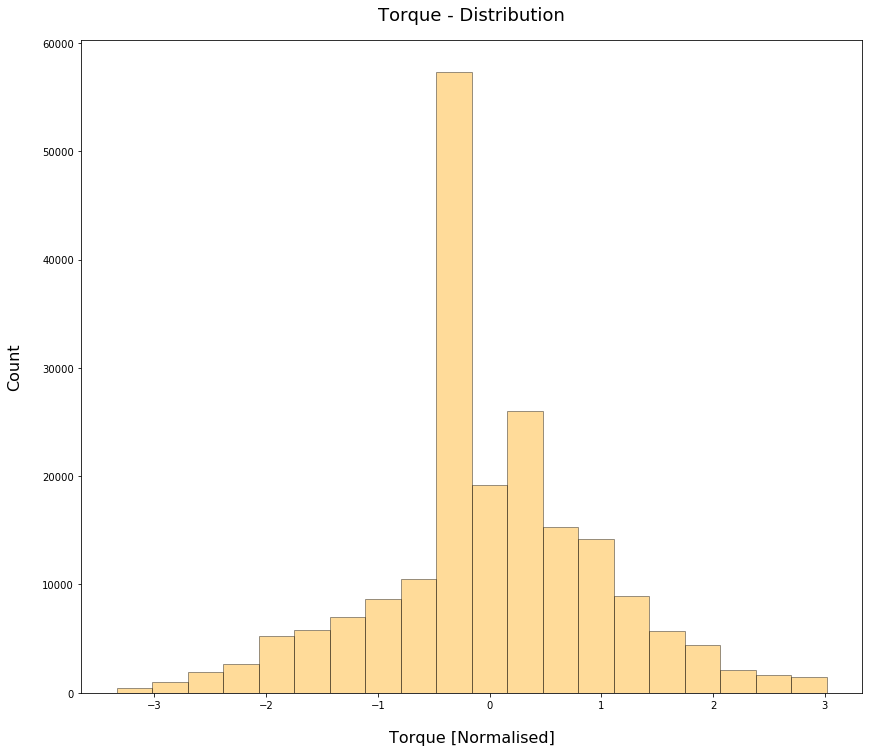

In [28]:
# Investigate Torque distribution
plt.figure(figsize = (14, 12))

# Create histogram
y_data = training_set["torque"]
lin_corr_fig = sns.distplot(y_data, bins = 20, hist = True, kde = False, color = "orange", hist_kws = {'edgecolor':'black'})

# Set title, axes
plt.title("Torque - Distribution", fontsize = save_figs.TITLE_FONTSIZE, pad = 20)
plt.xlabel("Torque [Normalised]", fontsize = 16, labelpad = 20)
plt.ylabel("Count", fontsize = 16, labelpad = 20)

# Save fig
if SAVE_FIGURES == True: 
    name = 'Torque_Distribution'
    save_string = save_figs.generate_fig_save_string(name)
    plt.savefig(save_string, format = 'png', dpi = 600)

plt.show()

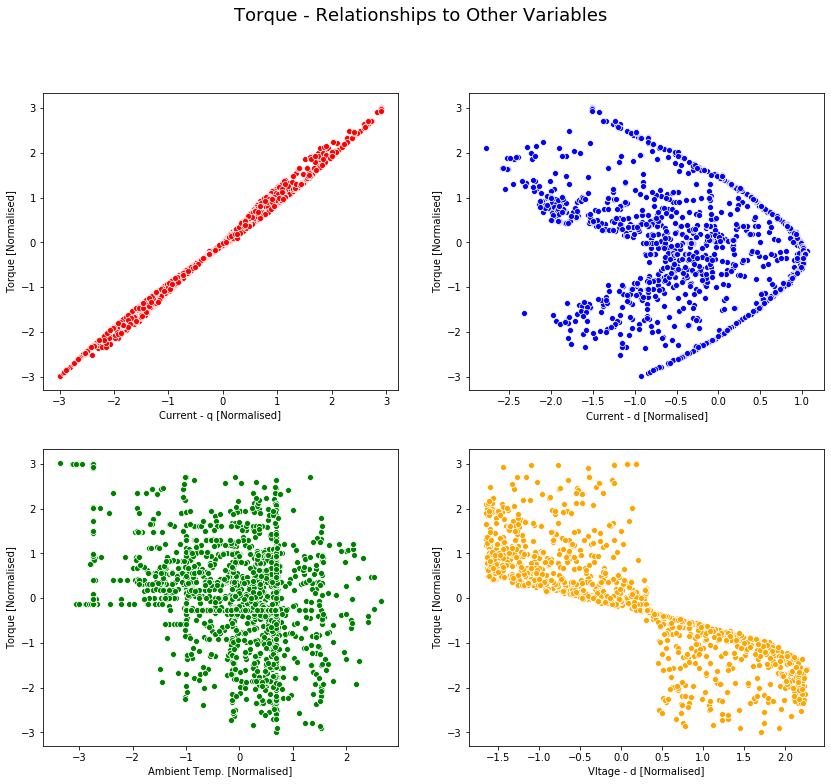

In [29]:
# Investigate relationship to other variables (i_q, i_d, ambient, u_d)
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 12))

data = eda_subset

# Populate each subplot
sns.scatterplot(data = data, x = "i_q", y = "torque", ax = axes[0,0], color = 'red')
sns.scatterplot(data = data, x = "i_d", y = "torque", ax = axes[0,1], color = 'blue')
sns.scatterplot(data = data, x = "ambient", y = "torque", ax = axes[1,0], color = 'green')
sns.scatterplot(data = data, x = "u_d", y = "torque", ax = axes[1,1], color = 'orange')

# Set title, axes
plt.suptitle("Torque - Relationships to Other Variables", fontsize = save_figs.TITLE_FONTSIZE)

axes[0,0].set(xlabel = 'Current - q [Normalised]', ylabel = 'Torque [Normalised]')
axes[0,1].set(xlabel = 'Current - d [Normalised]', ylabel = 'Torque [Normalised]')
axes[1,0].set(xlabel = 'Ambient Temp. [Normalised]', ylabel = 'Torque [Normalised]')
axes[1,1].set(xlabel = 'Vltage - d [Normalised]', ylabel = 'Torque [Normalised]')

# Save fig
if SAVE_FIGURES == True: 
    name = 'Torque_Relationships'
    save_string = save_figs.generate_fig_save_string(name)
    fig.savefig(save_string, format = 'png', dpi = 600)

plt.show()

In [24]:
# Investigating coolant dependency on ambient.
corr_matrix["coolant"].sort_values(ascending = False)

coolant           1.000000
stator_yoke       0.874691
stator_tooth      0.690937
stator_winding    0.511846
profile_id        0.498063
ambient           0.437470
pm                0.433865
u_d               0.178905
i_d               0.107323
u_q               0.033112
motor_speed      -0.029486
i_q              -0.186963
torque           -0.190596
Name: coolant, dtype: float64

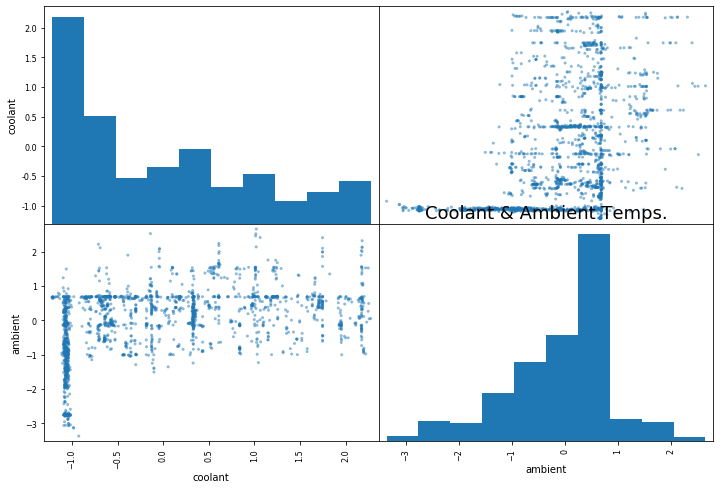

In [25]:
attributes = ["coolant", "ambient"]

scatter_matrix(eda_subset[attributes], figsize = (12, 8))

plt.title('Coolant & Ambient Temps.', fontsize = save_figs.TITLE_FONTSIZE)

plt.show()

In [26]:
# Create independent coolant parameter.
eda_subset['ind_coolant'] = eda_subset['coolant'] / eda_subset['ambient'] 

# Evaluate correlation
corr_matrix = eda_subset.corr()

In [27]:
# Evaluate correlation for pm
corr_matrix["ind_coolant"].sort_values(ascending = False)

# Doesn't appear to correlate well with target values; Leave for now.

ind_coolant       1.000000
profile_id        0.032094
u_q               0.027549
i_d               0.024961
u_d               0.003015
ambient           0.001543
motor_speed      -0.001219
stator_winding   -0.002830
i_q              -0.003389
torque           -0.004058
stator_tooth     -0.004863
stator_yoke      -0.008831
coolant          -0.009561
pm               -0.015113
Name: ind_coolant, dtype: float64